# Assignment 8: DT

<ol>
    <li><strong>Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical, numerical features +  preprocessed_eassay (TFIDF)</li>
            <li><font color='red'>Set 2</font>: categorical, numerical features +  preprocessed_eassay (TFIDF W2V)</li>        </ul>
    </li>
    <li><strong>The hyper paramter tuning (best `depth` in range [1, 5, 10, 50], and the best `min_samples_split` in range [5, 10, 100, 500])</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>find the best hyper paramter using k-fold cross validation(use gridsearch cv or randomsearch cv)/simple cross validation data(you can write your own for loops refer sample solution)</li>
        </ul>
    </li>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/Gp2DQmh.jpg' width=500px> with X-axis as <strong>min_sample_split</strong>, Y-axis as <strong>max_depth</strong>, and Z-axis as <strong>AUC Score</strong> , we have given the notebook which explains how to plot this 3d plot, you can find it in the same drive <i>3d_scatter_plot.ipynb</i></li>
            <p style="text-align:center;font-size:30px;color:red;"><strong>or</strong></p> <br>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/fgN9aUP.jpg' width=300px> <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heat maps</a> with rows as <strong>n_estimators</strong>, columns as <strong>max_depth</strong>, and values inside the cell representing <strong>AUC Score</strong> </li>
    <li>You choose either of the plotting techniques out of 3d plot or heat map</li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='https://i.imgur.com/wMQDTFe.jpg' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points
    <img src='https://i.imgur.com/IdN5Ctv.png' width=300px></li>
    <li>Once after you plot the confusion matrix with the test data, get all the `false positive data points`
        <ul>
            <li> Plot the WordCloud(https://www.geeksforgeeks.org/generating-word-cloud-python/) with the words of essay text of these `false positive data points`</li>
            <li> Plot the box plot with the `price` of these `false positive data points`</li>
            <li> Plot the pdf with the `teacher_number_of_previously_posted_projects` of these `false positive data points`</li>
        </ul>
        </ul>
    </li>
   <li><b>Task 2: </b>For this task consider set-1 features. Select all the features which are having non-zero feature importance.You can get the feature importance using  'feature_importances_` 
   (https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html), discard the all other remaining features and then apply any of the model of you choice i.e. (Dession tree, Logistic Regression, Linear SVM), you need to do hyperparameter tuning corresponding to the model you selected and procedure in step 2 and step 3<br>
  Note: when you want to find the feature importance make sure you don't use max_depth parameter keep it None.
  </li>
    <br>
    <li>You need to summarize the results at the end of the notebook, summarize it in the table format
        <img src='http://i.imgur.com/YVpIGGE.jpg' width=400px>
    </li>
</ol>

<h1>1. Decision Tree </h1>

# Task1

## 1.1 Loading Data

In [1]:
#Importing libraries

import pandas as pd
import numpy as np
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/

import pickle
from tqdm import tqdm
import os

#from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter


In [2]:
data  = pd.read_csv('preprocessed_data.csv',nrows=60000)
data.head(5)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price
0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05
1,ut,ms,grades_3_5,4,1,specialneeds,specialneeds,imagine 8 9 years old you third grade classroo...,213.03
2,ca,mrs,grades_prek_2,10,1,literacy_language,literacy,having class 24 students comes diverse learner...,329.00
3,ga,mrs,grades_prek_2,2,1,appliedlearning,earlydevelopment,i recently read article giving students choice...,481.04
4,wa,mrs,grades_3_5,2,1,literacy_language,literacy,my students crave challenge eat obstacles brea...,17.74


In [3]:
data.columns

Index(['school_state', 'teacher_prefix', 'project_grade_category',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay', 'price'],
      dtype='object')

In [4]:
y = data['project_is_approved'].values
X = data.drop(['project_is_approved'], axis=1)
X.head(1)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price
0,ca,mrs,grades_prek_2,53,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05


<h2>1.2 Splitting data into Train and cross validation(or test): Stratified Sampling</h2>

In [5]:
# train, CV, test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, stratify=y)
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.30, stratify=y_train)

<h2>1.3 Make Data Model Ready: encoding Text Feature eassay</h2>

<h3>1.3.1 TFIDF featurization of eassy feature</h3>

In [6]:
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)

from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10,ngram_range=(1,4),max_features=5000)
text_tfidf = vectorizer.fit(X_train['essay'].values)

# we use the fitted CountVectorizer to convert the text to vector
X_train_essay_tfidf= vectorizer.transform(X_train['essay'].values)
X_cv_essay_tfidf = vectorizer.transform(X_cv['essay'].values)
X_test_essay_tfidf = vectorizer.transform(X_test['essay'].values)

print("After vectorizations")
print(X_train_essay_tfidf.shape, y_train.shape)
print(X_cv_essay_tfidf.shape, y_cv.shape)
print(X_test_essay_tfidf.shape, y_test.shape)
print("="*100)
essay_features_tfidf = vectorizer.get_feature_names()

(29400, 8) (29400,)
(12600, 8) (12600,)
(18000, 8) (18000,)
After vectorizations
(29400, 5000) (29400,)
(12600, 5000) (12600,)
(18000, 5000) (18000,)


<h3>1.3.2 TFIDF W2V featurization of eassy feature</h3>

In [7]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

<h4>tfidf_w2v_vectors for Train data</h4>

In [8]:
tfidf_model = TfidfVectorizer(min_df=10,ngram_range=(1,4), max_features=50000)
tfidf_model.fit(X_train['essay'])
tfidf_model.transform(X_train['essay'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [9]:
tfidf_w2v_vectors_X_train_essay = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['essay']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_X_train_essay.append(vector)

print(len(tfidf_w2v_vectors_X_train_essay))
print(len(tfidf_w2v_vectors_X_train_essay[0]))

100%|██████████| 29400/29400 [01:46<00:00, 275.68it/s]

29400
300


<h4>tfidf_w2v_vectors for CV data</h4>

In [10]:
#tfidf_model = TfidfVectorizer()
tfidf_model.transform(X_cv['essay'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [11]:
tfidf_w2v_vectors_X_cv_essay = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_cv['essay']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_X_cv_essay.append(vector)

print(len(tfidf_w2v_vectors_X_cv_essay))
print(len(tfidf_w2v_vectors_X_cv_essay[0]))

100%|██████████| 12600/12600 [00:46<00:00, 269.56it/s]

12600
300


<h4>tfidf_w2v_vectors For Test data</h4>

In [12]:
#tfidf_model = TfidfVectorizer()
tfidf_model.transform(X_test['essay'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [13]:
tfidf_w2v_vectors_X_test_essay = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['essay']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_X_test_essay.append(vector)

print(len(tfidf_w2v_vectors_X_test_essay))
print(len(tfidf_w2v_vectors_X_test_essay[0]))

100%|██████████| 18000/18000 [01:04<00:00, 278.26it/s]

18000
300


<h2>1.4 Make Data Model Ready: encoding numerical, categorical features</h2>

<h3>1.4.1 encoding categorical features: School State</h3>

In [14]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['school_state'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_state_ohe = vectorizer.transform(X_train['school_state'].values)
X_cv_state_ohe = vectorizer.transform(X_cv['school_state'].values)
X_test_state_ohe = vectorizer.transform(X_test['school_state'].values)

print("After vectorizations")
print(X_train_state_ohe.shape, y_train.shape)
print(X_cv_state_ohe.shape, y_cv.shape)
print(X_test_state_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)
school_state_features = vectorizer.get_feature_names()

After vectorizations
(29400, 51) (29400,)
(12600, 51) (12600,)
(18000, 51) (18000,)
['ak', 'al', 'ar', 'az', 'ca', 'co', 'ct', 'dc', 'de', 'fl', 'ga', 'hi', 'ia', 'id', 'il', 'in', 'ks', 'ky', 'la', 'ma', 'md', 'me', 'mi', 'mn', 'mo', 'ms', 'mt', 'nc', 'nd', 'ne', 'nh', 'nj', 'nm', 'nv', 'ny', 'oh', 'ok', 'or', 'pa', 'ri', 'sc', 'sd', 'tn', 'tx', 'ut', 'va', 'vt', 'wa', 'wi', 'wv', 'wy']


<h3>1.4.2 encoding categorical features: teacher_prefix</h3>

In [15]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['teacher_prefix'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_teacher_ohe = vectorizer.transform(X_train['teacher_prefix'].values)
X_cv_teacher_ohe = vectorizer.transform(X_cv['teacher_prefix'].values)
X_test_teacher_ohe = vectorizer.transform(X_test['teacher_prefix'].values)

print("After vectorizations")
print(X_train_teacher_ohe.shape, y_train.shape)
print(X_cv_teacher_ohe.shape, y_cv.shape)
print(X_test_teacher_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)
teacher_prefix_features = vectorizer.get_feature_names()

After vectorizations
(29400, 5) (29400,)
(12600, 5) (12600,)
(18000, 5) (18000,)
['dr', 'mr', 'mrs', 'ms', 'teacher']


<h3>1.4.3 encoding categorical features: project_grade_category</h3>

In [16]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['project_grade_category'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_grade_ohe = vectorizer.transform(X_train['project_grade_category'].values)
X_cv_grade_ohe = vectorizer.transform(X_cv['project_grade_category'].values)
X_test_grade_ohe = vectorizer.transform(X_test['project_grade_category'].values)

print("After vectorizations")
print(X_train_grade_ohe.shape, y_train.shape)
print(X_cv_grade_ohe.shape, y_cv.shape)
print(X_test_grade_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)
project_grade_features = vectorizer.get_feature_names()

After vectorizations
(29400, 4) (29400,)
(12600, 4) (12600,)
(18000, 4) (18000,)
['grades_3_5', 'grades_6_8', 'grades_9_12', 'grades_prek_2']


<h3>1.4.4 encoding categorical features: clean_categories</h3>

In [17]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['clean_categories'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_categories_ohe = vectorizer.transform(X_train['clean_categories'].values)
X_cv_categories_ohe = vectorizer.transform(X_cv['clean_categories'].values)
X_test_categories_ohe = vectorizer.transform(X_test['clean_categories'].values)

print("After vectorizations")
print(X_train_categories_ohe.shape, y_train.shape)
print(X_cv_categories_ohe.shape, y_cv.shape)
print(X_test_categories_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)
categories_features = vectorizer.get_feature_names()

After vectorizations
(29400, 9) (29400,)
(12600, 9) (12600,)
(18000, 9) (18000,)
['appliedlearning', 'care_hunger', 'health_sports', 'history_civics', 'literacy_language', 'math_science', 'music_arts', 'specialneeds', 'warmth']


<h3>1.4.5 encoding categorical features: clean_subcategories</h3>

In [18]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['clean_subcategories'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_subcategories_ohe = vectorizer.transform(X_train['clean_subcategories'].values)
X_cv_subcategories_ohe = vectorizer.transform(X_cv['clean_subcategories'].values)
X_test_subcategories_ohe = vectorizer.transform(X_test['clean_subcategories'].values)

print("After vectorizations")
print(X_train_subcategories_ohe.shape, y_train.shape)
print(X_cv_subcategories_ohe.shape, y_cv.shape)
print(X_test_subcategories_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)
subcategories_features = vectorizer.get_feature_names()

After vectorizations
(29400, 30) (29400,)
(12600, 30) (12600,)
(18000, 30) (18000,)
['appliedsciences', 'care_hunger', 'charactereducation', 'civics_government', 'college_careerprep', 'communityservice', 'earlydevelopment', 'economics', 'environmentalscience', 'esl', 'extracurricular', 'financialliteracy', 'foreignlanguages', 'gym_fitness', 'health_lifescience', 'health_wellness', 'history_geography', 'literacy', 'literature_writing', 'mathematics', 'music', 'nutritioneducation', 'other', 'parentinvolvement', 'performingarts', 'socialsciences', 'specialneeds', 'teamsports', 'visualarts', 'warmth']


<h3>1.4.6 encoding numerical features: Price</h3>

In [19]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.
normalizer.fit(X_train['price'].values.reshape(1,-1))

X_train_price_norm = normalizer.transform(X_train['price'].values.reshape(1,-1))#Normalize() function will work on each row/sample but not on each column.
X_train_price_norm = X_train_price_norm.reshape(-1,1)
X_cv_price_norm = normalizer.transform(X_cv['price'].values.reshape(1,-1))
X_cv_price_norm = X_cv_price_norm.reshape(-1,1)
X_test_price_norm = normalizer.transform(X_test['price'].values.reshape(1,-1))
X_test_price_norm = X_test_price_norm.reshape(-1,1)



print("After vectorizations")
print(X_train_price_norm.shape, y_train.shape)
print(X_cv_price_norm.shape, y_cv.shape)
print(X_test_price_norm.shape, y_test.shape)
print("="*100)


After vectorizations
(29400, 1) (29400,)
(12600, 1) (12600,)
(18000, 1) (18000,)



<h3>1.4.7 encoding numerical features: teacher_number_of_previously_posted_projects</h3>

In [20]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
# normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.
normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))

X_train_projects_norm = normalizer.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1)) #Normalize() function will work on each row/sample but not on each column.
X_train_projects_norm = X_train_projects_norm.reshape(-1,1)
X_cv_projects_norm = normalizer.transform(X_cv['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))
X_cv_projects_norm = X_cv_projects_norm.reshape(-1,1)
X_test_projects_norm = normalizer.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))
X_test_projects_norm = X_test_projects_norm.reshape(-1,1)



print("After vectorizations")
print(X_train_projects_norm.shape, y_train.shape)
print(X_cv_projects_norm.shape, y_cv.shape)
print(X_test_projects_norm.shape, y_test.shape)
print("="*100)


After vectorizations
(29400, 1) (29400,)
(12600, 1) (12600,)
(18000, 1) (18000,)



### 1.4.8 Concatinating all the features

<h3>Set1: Features:categorical, numerical features + eassay (tfidf vec)</h3>

In [21]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr_tfidf = hstack((X_train_essay_tfidf, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe,X_train_categories_ohe,X_train_subcategories_ohe, X_train_price_norm,X_train_projects_norm)).tocsr()
X_cr_tfidf = hstack((X_cv_essay_tfidf, X_cv_state_ohe, X_cv_teacher_ohe, X_cv_grade_ohe, X_cv_categories_ohe,X_cv_subcategories_ohe,X_cv_price_norm,X_cv_projects_norm)).tocsr()
X_te_tfidf = hstack((X_test_essay_tfidf, X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe,X_test_categories_ohe,X_test_subcategories_ohe, X_test_price_norm,X_test_projects_norm)).tocsr()

print("Final Data matrix")
print(X_tr_tfidf.shape, y_train.shape)
print(X_cr_tfidf.shape, y_cv.shape)
print(X_te_tfidf.shape, y_test.shape)
print("="*100)

Final Data matrix
(29400, 5101) (29400,)
(12600, 5101) (12600,)
(18000, 5101) (18000,)


<h3>Set2 : Features:categorical, numerical features + eassay (TFIDF W2V)</h3>

In [22]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr_tfidf_W2V = hstack((tfidf_w2v_vectors_X_train_essay, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe,X_train_categories_ohe,X_train_subcategories_ohe, X_train_price_norm,X_train_projects_norm)).tocsr()
X_cr_tfidf_W2V = hstack((tfidf_w2v_vectors_X_cv_essay, X_cv_state_ohe, X_cv_teacher_ohe, X_cv_grade_ohe, X_cv_categories_ohe,X_cv_subcategories_ohe,X_cv_price_norm,X_cv_projects_norm)).tocsr()
X_te_tfidf_W2V = hstack((tfidf_w2v_vectors_X_test_essay, X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe,X_test_categories_ohe,X_test_subcategories_ohe, X_test_price_norm,X_test_projects_norm)).tocsr()

print("Final Data matrix")
print(X_tr_tfidf_W2V.shape, y_train.shape)
print(X_cr_tfidf_W2V.shape, y_cv.shape)
print(X_te_tfidf_W2V.shape, y_test.shape)
print("="*100)

Final Data matrix
(29400, 401) (29400,)
(12600, 401) (12600,)
(18000, 401) (18000,)


<h2>1.5 Appling  Decision Tree on different kind of featurization as mentioned in the instructions</h2>

<br>Apply  Decision Tree on different kind of featurization as mentioned in the instructions
<br> For Every model that you work on make sure you do the step 2 and step 3 of instrucations

<h3>1.5.1 Modeling of set1 features</h3>

<h3>Hyperparameter Tuning</h3>

In [23]:
def batch_predict(clf, data):
    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs

    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000
    # consider you X_tr shape is 49041, then your tr_loop will be 49041 - 49041%1000 = 49000
    # in this for loop we will iterate unti the last 1000 multiplier
    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1])
    # we will be predicting for the last data points
    if data.shape[0]%1000 !=0:
        y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
    
    return y_data_pred

In [24]:
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score
"""
y_true : array, shape = [n_samples] or [n_samples, n_classes]
True binary labels or binary label indicators.

y_score : array, shape = [n_samples] or [n_samples, n_classes]
Target scores, can either be probability estimates of the positive class, confidence values, or non-thresholded measure of
decisions (as returned by “decision_function” on some classifiers). 
For binary y_true, y_score is supposed to be the score of the class with greater label.

"""

train_auc = []
cv_auc = []
max_depth_plot = []
min_samples_split_plot =[]
min_samples_split=[5, 10, 100, 500]
max_depth=[1, 5, 10, 50]
for i in tqdm(min_samples_split):
    for j in max_depth:
        min_samples_split_plot.append(i)
        max_depth_plot.append(j)
        clf=DecisionTreeClassifier(random_state=0,min_samples_split=i,max_depth=j)
        clf.fit(X_tr_tfidf, y_train)

        y_train_pred = batch_predict(clf, X_tr_tfidf)    
        y_cv_pred = batch_predict(clf, X_cr_tfidf)

    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs        
        train_auc.append(roc_auc_score(y_train,y_train_pred))
        cv_auc.append(roc_auc_score(y_cv, y_cv_pred))




100%|██████████| 4/4 [04:22<00:00, 65.64s/it]


In [25]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

In [26]:
x1 = min_samples_split_plot
y1 = max_depth_plot
z1 = train_auc

x2 = min_samples_split_plot
y2 = max_depth_plot
z2 = cv_auc

In [27]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='min_samples_split'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

In [28]:
# from the error plot we choose best Hyperparameters such that, we will have maximum AUC on cv data and gap between the train and cv is less


#here we are choosing the best Hyperparameters based on forloop results
min_samples_split_best = 10
max_depth_best = 5

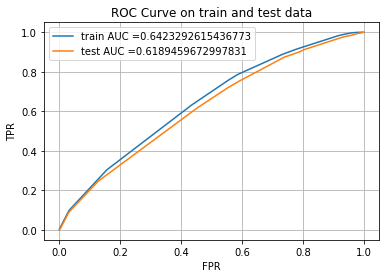

In [29]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc
from sklearn.tree import DecisionTreeClassifier

clf=DecisionTreeClassifier(random_state=0,min_samples_split=min_samples_split_best,max_depth=max_depth_best)
clf.fit(X_tr_tfidf, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(clf, X_tr_tfidf)    
y_test_pred = batch_predict(clf, X_te_tfidf)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC Curve on train and test data")
plt.grid()
plt.show()

<h3>1.5.2 Ploting confusion matrix for set1 features</h3>

In [30]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

In [31]:
print("="*100)
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
print("Train confusion matrix")
print(confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t)))

the maximum value of tpr*(1-fpr) 0.35714394530297855 for threshold 0.862
Train confusion matrix
[[ 2640  2032]
 [ 9099 15629]]
Test confusion matrix
[[1569 1292]
 [5823 9316]]


Train confusion matrix


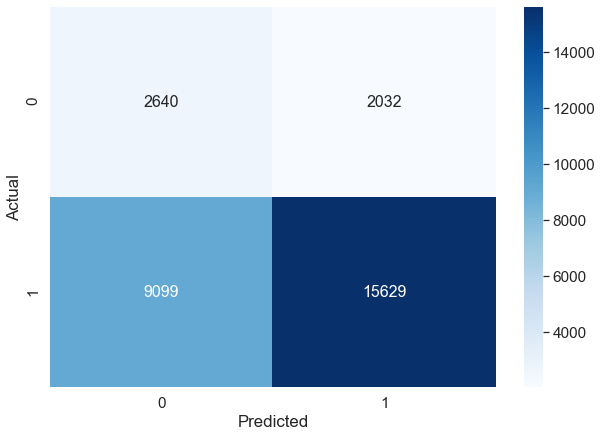

In [32]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

print("Train confusion matrix")
data = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
df_cm = pd.DataFrame(data, columns=np.unique(y_test), index = np.unique(y_test))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16},fmt='g')# font size


Test confusion matrix


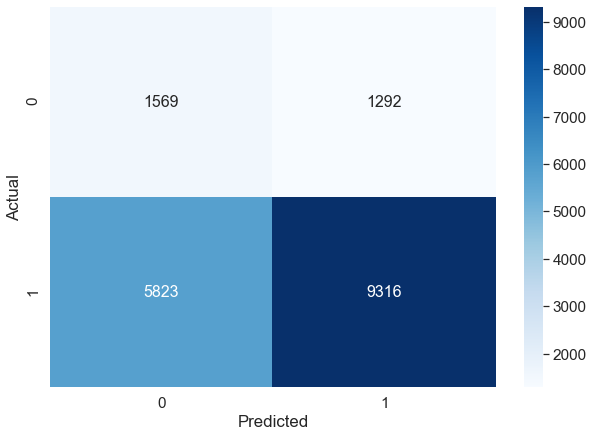

In [33]:
print("Test confusion matrix")
data = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
df_cm = pd.DataFrame(data, columns=np.unique(y_test), index = np.unique(y_test))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
y_pred_test = predict_with_best_t(y_test_pred, best_t)
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16},fmt='g')# font size


<h3>1.5.3 Ploting word cloud of essay feature </h3>

In [34]:
y_pred_test_t = np.transpose(y_pred_test)

In [35]:
# Getting eassy feature of false positive data points from test data
X_test_fp = X_test[(y_test == 0) & (y_pred_test_t == 1)]
essay_fp = X_test_fp['essay']

len(essay_fp)

1292

In [36]:
from wordcloud import WordCloud, STOPWORDS 

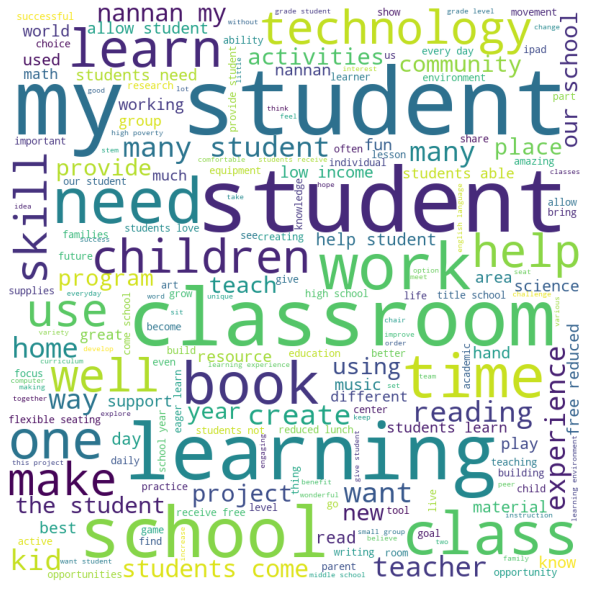

In [37]:
df = essay_fp
  
comment_words = '' 
stopwords = set(STOPWORDS) 
  
# iterate through the csv file 
for val in df: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

<h3>1.5.4 Ploting Box plot of Price Feature </h3>

In [38]:
price_fp = X_test_fp['price'] # Considering price feature of False positive data points


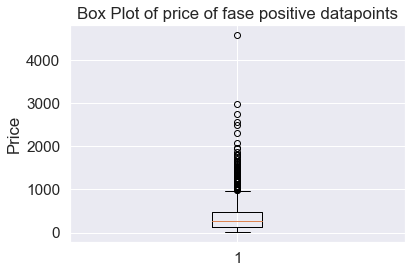

In [39]:

plt.boxplot(price_fp)
plt.ylabel('Price')
plt.title("Box Plot of price of fase positive datapoints")
plt.show()

<h3>1.5.5 Ploting PDF teacher_number_of_previously_posted_projects </h3>

In [40]:
previously_posted_projects=X_test_fp['teacher_number_of_previously_posted_projects'] #Considering "teacher_number_of_previously_posted_projects" feature of False positive data points

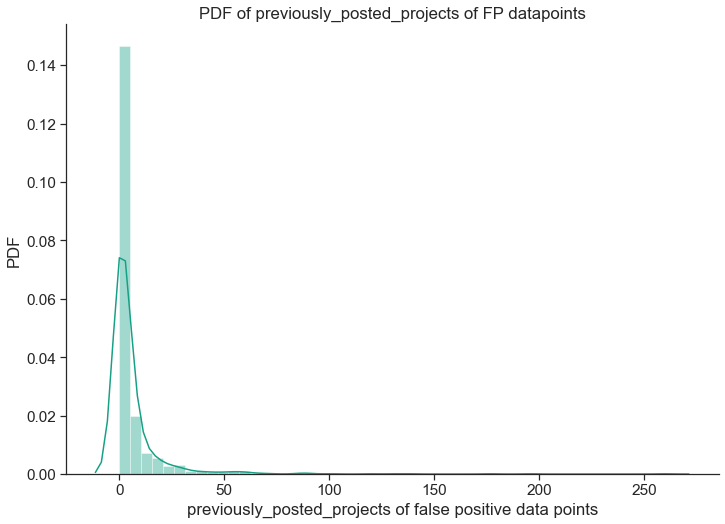

In [41]:
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
sns.distplot(previously_posted_projects, color='#16A085')
plt.xlabel('previously_posted_projects of false positive data points')
plt.ylabel('PDF')
plt.title('PDF of previously_posted_projects of FP datapoints')
sns.despine()

<h3>1.5.6 Modeling of set2 features</h3>

In [42]:
def batch_predict(clf, data):
    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs

    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000
    # consider you X_tr shape is 49041, then your tr_loop will be 49041 - 49041%1000 = 49000
    # in this for loop we will iterate unti the last 1000 multiplier
    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1])
    # we will be predicting for the last data points
    if data.shape[0]%1000 !=0:
        y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
    
    return y_data_pred

In [43]:
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score
"""
y_true : array, shape = [n_samples] or [n_samples, n_classes]
True binary labels or binary label indicators.

y_score : array, shape = [n_samples] or [n_samples, n_classes]
Target scores, can either be probability estimates of the positive class, confidence values, or non-thresholded measure of
decisions (as returned by “decision_function” on some classifiers). 
For binary y_true, y_score is supposed to be the score of the class with greater label.

"""

train_auc = []
cv_auc = []
max_depth_plot = []
min_samples_split_plot =[]
min_samples_split=[5, 10, 100, 500]
max_depth=[1, 5, 10, 50]
for i in tqdm(min_samples_split):
    for j in max_depth:
        min_samples_split_plot.append(i)
        max_depth_plot.append(j)
        clf=DecisionTreeClassifier(random_state=0,min_samples_split=i,max_depth=j)
        clf.fit(X_tr_tfidf_W2V, y_train)

        y_train_pred = batch_predict(clf, X_tr_tfidf_W2V)    
        y_cv_pred = batch_predict(clf, X_cr_tfidf_W2V)

    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs        
        train_auc.append(roc_auc_score(y_train,y_train_pred))
        cv_auc.append(roc_auc_score(y_cv, y_cv_pred))




100%|██████████| 4/4 [08:23<00:00, 125.92s/it]


In [44]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

In [45]:
x1 = min_samples_split_plot
y1 = max_depth_plot
z1 = train_auc

x2 = min_samples_split_plot
y2 = max_depth_plot
z2 = cv_auc

In [46]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='min_samples_split'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

In [96]:
# from the error plot we choose K such that, we will have maximum AUC on cv data and gap between the train and cv is less
# Note: based on the method you use you might get different hyperparameter values as best one
# so, you choose according to the method you choose, you use gridsearch if you are having more computing power and note it will take more time
# if you increase the cv values in the GridSearchCV you will get more rebust results.

#here we are choosing the best_k based on forloop results
min_samples_split_best = 10
max_depth_best = 5

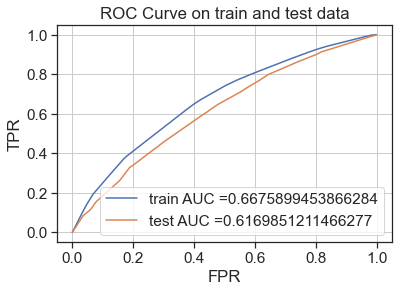

In [97]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc
from sklearn.tree import DecisionTreeClassifier

clf=DecisionTreeClassifier(random_state=0,min_samples_split=min_samples_split_best,max_depth=max_depth_best)
clf.fit(X_tr_tfidf_W2V, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(clf, X_tr_tfidf_W2V)    
y_test_pred = batch_predict(clf, X_te_tfidf_W2V)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC Curve on train and test data")
plt.grid()
plt.show()

<h3>1.5.7 Ploting confusion matrix for set2 features</h3>

In [49]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

In [50]:
print("="*100)
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
print("Train confusion matrix")
print(confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t)))

the maximum value of tpr*(1-fpr) 0.3898538184488329 for threshold 0.858
Train confusion matrix
[[ 2809  1863]
 [ 8694 16034]]
Test confusion matrix
[[1563 1298]
 [5723 9416]]


Train confusion matrix


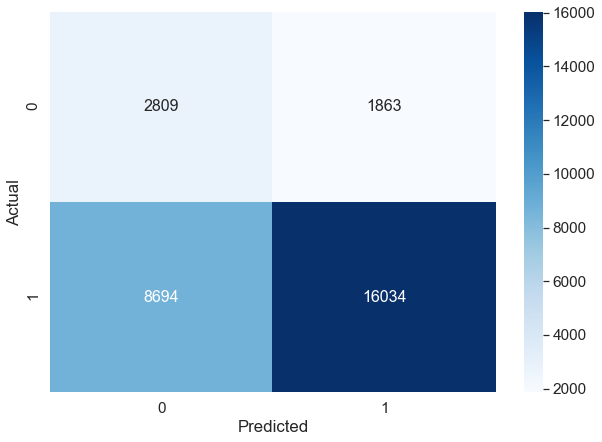

In [51]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

print("Train confusion matrix")
data = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
df_cm = pd.DataFrame(data, columns=np.unique(y_test), index = np.unique(y_test))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16},fmt='g')# font size


Test confusion matrix


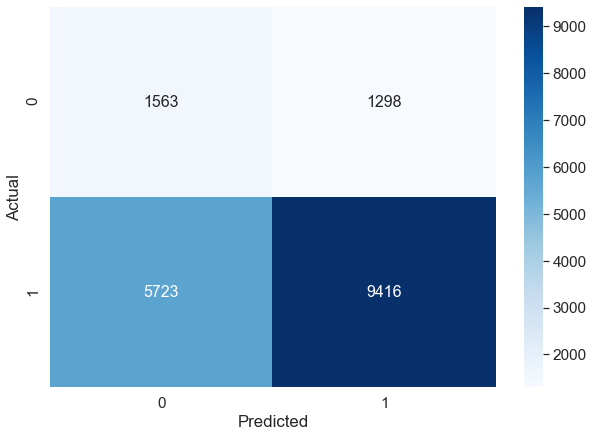

In [52]:
print("Test confusion matrix")
data = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
df_cm = pd.DataFrame(data, columns=np.unique(y_test), index = np.unique(y_test))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
y_pred_test = predict_with_best_t(y_test_pred, best_t)
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16},fmt='g')# font size


<h3>1.5.8 Ploting word cloud of essay feature </h3>

In [53]:
y_pred_test_t = np.transpose(y_pred_test)

In [54]:
# Getting eassy feature of false positive data points from test data
X_test_fp = X_test[(y_test == 0) & (y_pred_test_t == 1)]
essay_fp = X_test_fp['essay']
len(essay_fp)

1298

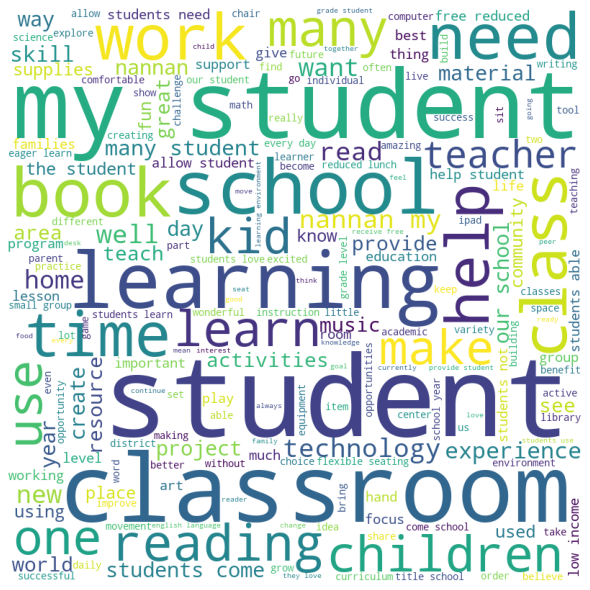

In [55]:
df = essay_fp
  
comment_words = '' 
stopwords = set(STOPWORDS) 
  
# iterate through the csv file 
for val in df: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

<h3>1.5.9 Ploting Box plot Price </h3>

In [56]:
price_fp = X_test_fp['price'] # Getting "Price " feature of false positive data points


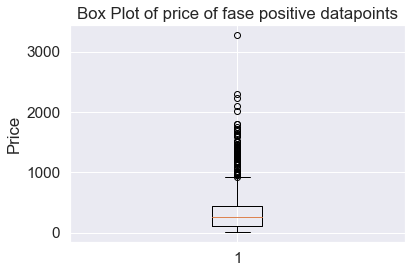

In [57]:

plt.boxplot(price_fp)
plt.ylabel('Price')
plt.title("Box Plot of price of fase positive datapoints")
plt.show()

<h3>1.5.10 Ploting PDF teacher_number_of_previously_posted_projects </h3>

In [58]:
previously_posted_projects=X_test_fp['teacher_number_of_previously_posted_projects']  # Getting "teacher_number_of_previously_posted_projects " feature of false positive data points

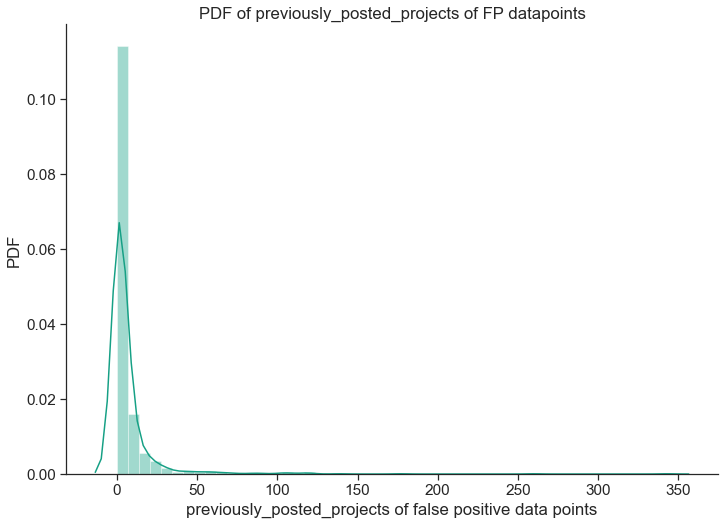

In [59]:
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
sns.distplot(previously_posted_projects, color='#16A085')
plt.xlabel('previously_posted_projects of false positive data points')
plt.ylabel('PDF')
plt.title('PDF of previously_posted_projects of FP datapoints')
sns.despine()

# Task2

<h2>1.6 Getting top features using `feature_importances_`</h2>

In [60]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

<h3>1.6.1 Getting Feature Importance for set1 features</h3>

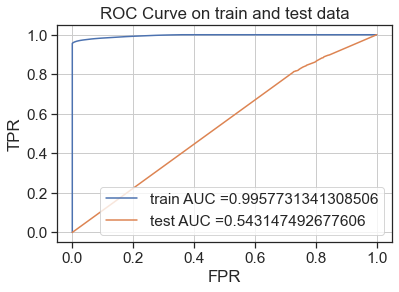

In [61]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc
from sklearn.tree import DecisionTreeClassifier

clf=DecisionTreeClassifier(random_state=0,min_samples_split=10,max_depth=None)
clf.fit(X_tr_tfidf, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(clf, X_tr_tfidf)    
y_test_pred = batch_predict(clf, X_te_tfidf)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC Curve on train and test data")
plt.grid()
plt.show()

In [62]:
featureImportance_values=clf.feature_importances_
featureImportance_values

array([0.        , 0.00067905, 0.00160961, ..., 0.        , 0.01738841,
       0.00620896])

In [63]:
# Getting non-zero feature importance values and there corresponding indices

import numpy as np 
featureImportance_values
  
print(featureImportance_values) 
  
print ('Indices of featureImportance_values !=0') 
  
feature_indices = np.where(featureImportance_values != 0) 
print(feature_indices) 
print("featureImportance_values which are != 0") 
print(featureImportance_values[feature_indices]) 
feature_indices= list(feature_indices[0])


[0.         0.00067905 0.00160961 ... 0.         0.01738841 0.00620896]
Indices of featureImportance_values !=0
(array([   1,    2,    4, ..., 5095, 5099, 5100], dtype=int64),)
featureImportance_values which are != 0
[0.00067905 0.00160961 0.00027877 ... 0.00042845 0.01738841 0.00620896]


In [64]:
# New train, CV, Test data set corresponding to non_zero feature indices
X_tr_tfidf_FI = X_tr_tfidf[:,feature_indices]
X_cr_tfidf_FI =X_cr_tfidf[:,feature_indices]
X_te_tfidf_FI = X_te_tfidf[:,feature_indices]
(X_tr_tfidf_FI).shape

(29400, 1456)

# 1.6.2 Modeling 

<h3>Hyperparameter Tuning</h3>

In [65]:
def batch_predict(clf, data):
    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs

    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000
    # consider you X_tr shape is 49041, then your tr_loop will be 49041 - 49041%1000 = 49000
    # in this for loop we will iterate unti the last 1000 multiplier
    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1])
    # we will be predicting for the last data points
    if data.shape[0]%1000 !=0:
        y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
    
    return y_data_pred

In [66]:
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score
"""
y_true : array, shape = [n_samples] or [n_samples, n_classes]
True binary labels or binary label indicators.

y_score : array, shape = [n_samples] or [n_samples, n_classes]
Target scores, can either be probability estimates of the positive class, confidence values, or non-thresholded measure of
decisions (as returned by “decision_function” on some classifiers). 
For binary y_true, y_score is supposed to be the score of the class with greater label.

"""

train_auc = []
cv_auc = []
max_depth_plot = []
min_samples_split_plot =[]
min_samples_split=[5, 10, 100, 500]
max_depth=[1, 5, 10, 50]
for i in tqdm(min_samples_split):
    for j in max_depth:
        min_samples_split_plot.append(i)
        max_depth_plot.append(j)
        clf=DecisionTreeClassifier(random_state=0,min_samples_split=i,max_depth=j)
        clf.fit(X_tr_tfidf_FI, y_train)

        y_train_pred = batch_predict(clf, X_tr_tfidf_FI)    
        y_cv_pred = batch_predict(clf, X_cr_tfidf_FI)

    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs        
        train_auc.append(roc_auc_score(y_train,y_train_pred))
        cv_auc.append(roc_auc_score(y_cv, y_cv_pred))




100%|██████████| 4/4 [02:20<00:00, 35.07s/it]


In [67]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

In [68]:
x1 = min_samples_split_plot
y1 = max_depth_plot
z1 = train_auc

x2 = min_samples_split_plot
y2 = max_depth_plot
z2 = cv_auc

In [69]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='min_samples_split'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

In [70]:
#  we choose best hyperparameterssuch that, we will have maximum AUC on cv data and gap between the train and cv is less

#here we are choosing the best hyperparameters based on forloop results
min_samples_split_best = 10
max_depth_best = 5

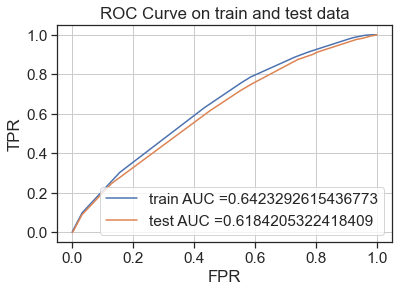

In [71]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc
from sklearn.tree import DecisionTreeClassifier

clf=DecisionTreeClassifier(random_state=0,min_samples_split=min_samples_split_best,max_depth=max_depth_best)
clf.fit(X_tr_tfidf_FI, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(clf, X_tr_tfidf_FI)    
y_test_pred = batch_predict(clf, X_te_tfidf_FI)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC Curve on train and test data")
plt.grid()
plt.show()

<h3>1.6.3 Ploting confusion matrix for set1 features</h3>

In [72]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

In [73]:
print("="*100)
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
print("Train confusion matrix")
print(confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t)))

the maximum value of tpr*(1-fpr) 0.35714394530297855 for threshold 0.862
Train confusion matrix
[[ 2640  2032]
 [ 9099 15629]]
Test confusion matrix
[[1568 1293]
 [5826 9313]]


Train confusion matrix


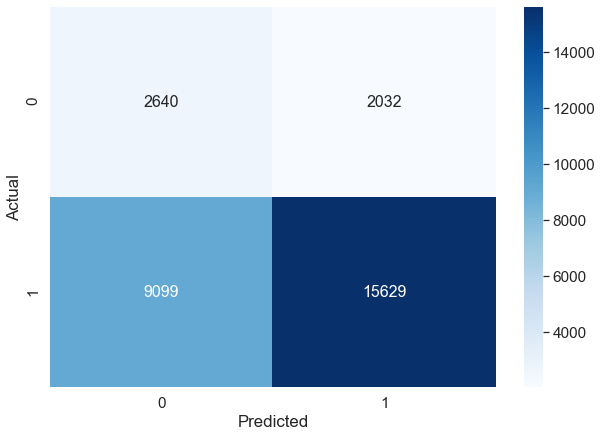

In [74]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

print("Train confusion matrix")
data = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
df_cm = pd.DataFrame(data, columns=np.unique(y_test), index = np.unique(y_test))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16},fmt='g')# font size


Test confusion matrix


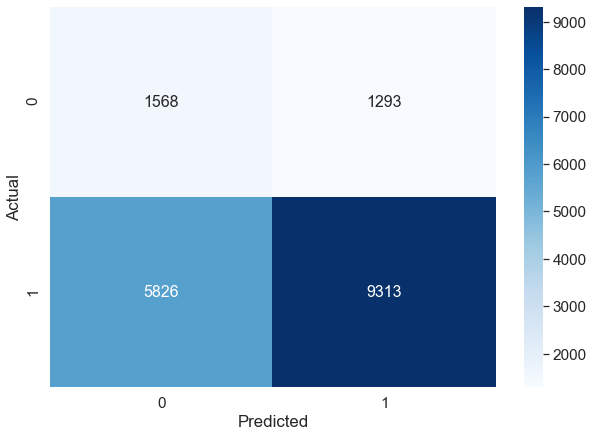

In [75]:
print("Test confusion matrix")
data = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
df_cm = pd.DataFrame(data, columns=np.unique(y_test), index = np.unique(y_test))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
y_pred_test = predict_with_best_t(y_test_pred, best_t)
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16},fmt='g')# font size


<h3>1.6.4 Ploting word cloud of essay feature </h3>

In [76]:
y_pred_test_t = np.transpose(y_pred_test) 

In [77]:
# Getting eassy feature of false positive data points from test data
X_test_fp = X_test[(y_test == 0) & (y_pred_test_t == 1)]
essay_fp = X_test_fp['essay']

len(essay_fp)

1293

In [78]:
from wordcloud import WordCloud, STOPWORDS 

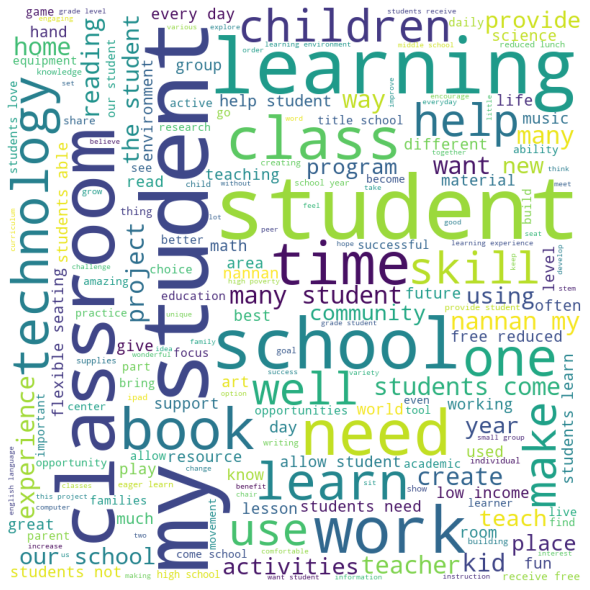

In [79]:
df = essay_fp
  
comment_words = '' 
stopwords = set(STOPWORDS) 
  
# iterate through the csv file 
for val in df: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

<h3>1.6.5  Ploting Box plot Price </h3>

In [80]:
price_fp = X_test_fp['price']


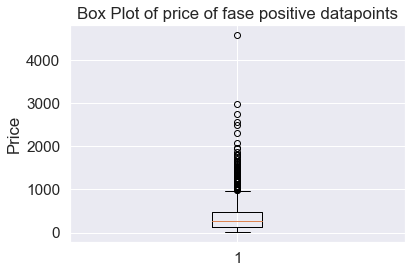

In [81]:

plt.boxplot(price_fp)
plt.ylabel('Price')
plt.title("Box Plot of price of fase positive datapoints")
plt.show()

<h3>1.6.6 Ploting PDF teacher_number_of_previously_posted_projects </h3>

In [82]:
previously_posted_projects=X_test_fp['teacher_number_of_previously_posted_projects']

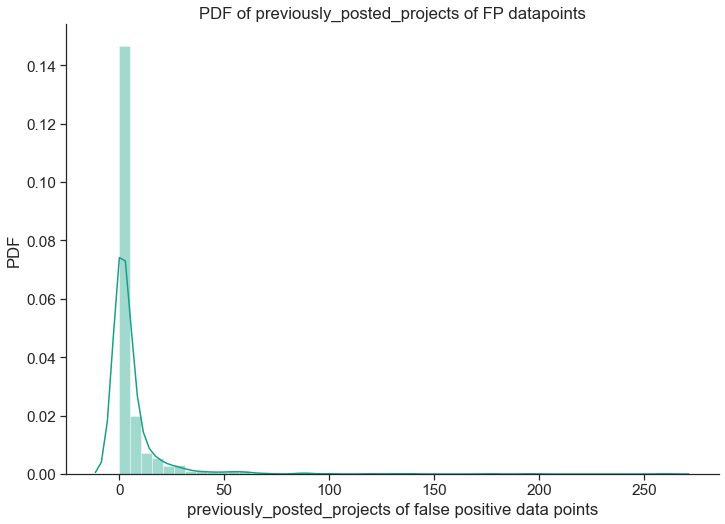

In [83]:
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
sns.distplot(previously_posted_projects, color='#16A085')
plt.xlabel('previously_posted_projects of false positive data points')
plt.ylabel('PDF')
plt.title('PDF of previously_posted_projects of FP datapoints')
sns.despine()

<h1>2. Summary</h1>

In [95]:
from prettytable import PrettyTable
    
x = PrettyTable()

x.field_names = ["Vectorizer", "Model", "Hyperparameter min_samples_split","Hyperparameter Max_Depth","Train_AUC","Test_AUC"]

x.add_row(["TFIDF","DecisionTreeClassifier", '10','5', '0.64','0.61'])
x.add_row(["TFIDF_W2V", "DecisionTreeClassifier", '10','5', '0.66','0.61'])
x.add_row(["TFIDF(Fe_Imp)", "DecisionTreeClassifier", '10','5', '0.64','0.61'])# Considering non_Zero Feature Importance values
print(x)

+---------------+------------------------+----------------------------------+--------------------------+-----------+----------+
|   Vectorizer  |         Model          | Hyperparameter min_samples_split | Hyperparameter Max_Depth | Train_AUC | Test_AUC |
+---------------+------------------------+----------------------------------+--------------------------+-----------+----------+
|     TFIDF     | DecisionTreeClassifier |                10                |            5             |    0.64   |   0.61   |
|   TFIDF_W2V   | DecisionTreeClassifier |                10                |            5             |    0.66   |   0.61   |
| TFIDF(Fe_Imp) | DecisionTreeClassifier |                10                |            5             |    0.64   |   0.61   |
+---------------+------------------------+----------------------------------+--------------------------+-----------+----------+
